# Taller 1
Vihlai Maldonado Cuevas \\
201619479

## Objetivo
Evaluar las capacidades del estudiante para realizar análisis de datos utilizando técnicas
estadísticas y de visualización que permitan entender un conjunto de datos, descubrir
insights y plantear hipótesis de negocio.

## Descripción

Para este taller se utilizará una base de datos de Spotify en donde se encuentran las
canciones más escuchadas incluyendo características tanto intrínsecas como extrínsecas
de cada canción. A continuación, se relaciona el diccionario de datos:

In [1]:
!pip install --upgrade pandas-profiling
!pip install markupsafe==2.0.1

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
# Importing libraries
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
plt.style.use("seaborn-deep")
import seaborn as sns
import csv
%matplotlib inline

In [3]:
# Pandas configuration for extending the number of rows and columns to visualize, if not limit set parameter to None or -1
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

## Lectura DataFrame
A continuación se hace la primera lectura del archivo CSV.

In [4]:
data_df = pd.read_csv('Data_Taller_1.csv', on_bad_lines='skip')
data_df.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre;
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000.0,77.0,0.751,0.834,1.0,-5.444,0.0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop;
1,"blink-182,All The Small Things,167066,False,19...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"Faith Hill,Breathe,250546,False,1999,66,0.529,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Bon Jovi,It's My Life,224493,False,2000,78,0.5...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,*NSYNC,Bye Bye Bye,200560.0,False,2000.0,NaN,0.614,0.928,8.0,-4.806,0.0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop;


In [5]:
!cat -n Data_Taller_1.csv | sed '2,4!d'

     2	Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,1,-5.444,0,0.0437,0.3,1.77e-05,0.355,0.894,95.053,pop;
     3	"blink-182,All The Small Things,167066,False,1999,79,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.0,0.612,0.684,148.726,""rock, pop""";
     4	"Faith Hill,Breathe,250546,False,1999,66,0.529,0.496,7,-9.007,1,0.029,0.173,0.0,0.251,0.278,136.859,""pop, country""";


De acuerdo al resultado anterior, observamos que hay filas que no quedaron correctamente leídas, esto es debido a la presencia de algunas comillas dobles o triples. Para solucionarlo se procede a realizar la limpieza del archivo, almacenamiento en un archivo nuevo y carga.
### Preprocesamiento del archivo

In [6]:
# read csv file
with open('Data_Taller_1.csv') as f:
    contents = f.readlines()
s = pd.Series(contents)
# replace quotes and other characters
raw_df = s.str.replace('"""', '"').str.replace('""', '"').str.strip('"').str.replace(';\n', '')
raw_df = raw_df.str.replace("Tyler, The Creator", '"Tyler, The Creator"')# This line have a comma in the artist name, its fixed adding a quote around it
# write new dataset with the data cleaned
with open('data_cleaned.csv', 'w') as f:
    for entry in raw_df:
        f.write(entry+'\n')
processed_df = pd.read_csv('data_cleaned.csv', sep=',')
pd.to_numeric(processed_df["year"]) # cast to numeric
processed_df # new Datafrane to use

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000,77.0,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066.0,False,1999,79.0,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546.0,False,1999,66.0,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493.0,False,2000,78.0,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560.0,False,2000,NaN,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Jonas Brothers,Sucker,181026.0,False,2019,79.0,0.842,0.734,1,-5.065,0,0.0588,0.0427,0.000000,0.1060,0.952,137.958,pop
1996,Taylor Swift,Cruel Summer,178426.0,False,2019,78.0,0.552,0.702,9,-5.707,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,pop
1997,Blanco Brown,The Git Up,200593.0,False,2019,69.0,0.847,0.678,9,-8.635,1,0.1090,0.0669,0.000000,0.2740,0.811,NaN,"hip hop, country"
1998,Sam Smith,Dancing With A Stranger (with Normani),171029.0,False,2019,75.0,0.741,0.520,8,-7.513,1,0.0656,0.4500,0.000002,0.2220,0.347,102.998,pop


In [7]:
processed_df.dtypes

artist               object
song                 object
duration_ms         float64
explicit             object
year                  int64
popularity          float64
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
genre                object
dtype: object

## Punto 1 - limpieza de datos
Describa el conjunto de datos, tipos de variables y destaque cualquier problema de calidad
de datos y procesos de limpieza que deba implementar.

In [8]:
# Duplicated row
processed_df[(processed_df['artist'] == 'Billie Eilish') & (processed_df['song'] =='lovely (with Khalid)')]

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
1819,Billie Eilish,lovely (with Khalid),200185.0,False,2018,86.0,0.351,0.296,4,-10.109,0,0.0333,0.934,0.0,0.095,0.12,115.284,"pop, Dance/Electronic"
1929,Billie Eilish,lovely (with Khalid),200185.0,False,2018,86.0,0.351,0.296,4,-10.109,0,0.0333,0.934,0.0,0.095,0.12,115.284,"pop, Dance/Electronic"


Revisando los duplicados, dado que estos no añaden información adicional, pero pueden iterferir con el *EDA*,  procedemos a eliminarlos.

In [9]:
processed_df = processed_df.drop_duplicates()

In [10]:
processed_df.shape

(1941, 18)

In [11]:
#Datos con valores nulos
processed_df[processed_df.isnull().any(axis=1)]

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
4,*NSYNC,Bye Bye Bye,200560.0,False,2000,NaN,0.614,0.928,8,-4.806,0,0.0516,0.04080,0.001040,0.0845,0.879,172.656,pop
81,Donell Jones,Where I Wanna Be,253626.0,False,1999,57.0,0.664,0.396,5,-9.131,0,NaN,0.52000,0.000000,0.2680,0.453,102.053,"pop, R&B"
162,Nelly Furtado,Turn Off The Light,276106.0,False,2000,1.0,0.587,0.679,2,-6.260,1,0.0927,0.08390,0.000316,0.4130,0.650,NaN,"hip hop, pop, latin"
175,DB Boulevard,Point Of View - Radio Edit,NaN,False,2018,0.0,0.676,0.715,6,-6.854,1,0.0287,0.00284,0.074600,0.0685,0.275,129.006,Dance/Electronic
264,Ashanti,Happy,262226.0,True,2002,61.0,0.727,0.515,2,NaN,0,0.0289,0.24100,0.000004,0.1240,0.695,89.488,"hip hop, pop, R&B"
408,O-Zone,Dragostea Din Tei,215431.0,False,2004,56.0,NaN,0.965,0,-3.947,1,0.0427,0.17700,0.000000,0.0577,0.672,130.103,pop
623,Infernal,From Paris to Berlin,209666.0,False,2004,57.0,0.741,0.869,9,-6.534,0,0.0816,0.09600,NaN,0.0396,0.839,126.069,pop
869,"H ""two"" O",What's It Gonna Be (feat. Platnum),207476.0,NaN,2008,55.0,0.733,0.900,9,-4.758,1,0.0341,0.00850,0.021800,0.1510,0.937,139.610,"Dance/Electronic"""
1105,Pitbull,Hey Baby (Drop It to the Floor) (feat. T-Pain),234453.0,False,2011,NaN,0.595,0.912,10,-3.428,0,0.0884,0.04340,0.000000,0.2590,0.762,128.024,"hip hop, pop, latin"
1130,Cobra Starship,You Make Me Feel... (feat. Sabi),215693.0,False,2011,70.0,0.668,0.857,7,-2.944,0,0.0535,NaN,0.000007,0.0385,0.748,131.959,"pop, Dance/Electronic"


In [12]:
processed_df.isnull().sum()

artist              0
song                0
duration_ms         2
explicit            1
year                0
popularity          3
danceability        3
energy              0
key                 0
loudness            1
mode                0
speechiness         1
acousticness        3
instrumentalness    1
liveness            0
valence             1
tempo               2
genre               1
dtype: int64

In [13]:
print('El porcentaje de filas con datos nulos es: ', processed_df[processed_df.isnull().any(axis=1)].shape[0]*100/processed_df.shape[0], '%')

El porcentaje de filas con datos nulos es:  0.9788768675940237 %


Relativo a los datos nulos, para este caso representan aproximadamente el **1%** del total de los datos. Asimismo, tenemos canciones a lo largo de varios años que contienen valores nulos, y en varias columnas, lo cual podría indicar que no es algo específico de un año en particular o un error sistemático en la recolección de los datos. Dado que este porcentaje es relativamente bajo comparado a todo el conjunto de datos, se propone eliminar los datos con valores nulos.

In [14]:
processed_df = processed_df.dropna(how='any')
processed_df.shape

(1922, 18)

In [15]:
processed_df['genre'].unique()

array(['pop', 'rock, pop', 'pop, country', 'rock, metal',
       'hip hop, pop, R&B', 'hip hop', 'pop, rock', 'pop, R&B',
       'Dance/Electronic', 'pop, Dance/Electronic',
       'rock, Folk/Acoustic, easy listening', 'metal', 'hip hop, pop',
       'R&B', 'pop, latin', 'Folk/Acoustic, rock',
       'pop, easy listening, Dance/Electronic', 'rock',
       'rock, blues, latin', 'pop, rock, metal', 'rock, pop, metal',
       'hip hop, R&B', 'pop, Folk/Acoustic', 'set()', 'pop"',
       'hip hop, pop, latin', 'hip hop, Dance/Electronic',
       'hip hop, pop, rock', 'World/Traditional, Folk/Acoustic',
       'Folk/Acoustic, pop', 'rock, easy listening', 'hip hop"',
       'World/Traditional, hip hop', 'hip hop, pop, R&B, latin',
       'rock, blues', 'rock, R&B, Folk/Acoustic, pop', 'latin',
       'pop, R&B, Dance/Electronic', 'World/Traditional, rock',
       'pop, rock, Dance/Electronic', 'pop, easy listening, jazz',
       'rock, Dance/Electronic', 'World/Traditional, pop, Folk/Acous

En resumen se implementaron las siguientes acciones de limpieza de datos y limpieza del archivo: 
* El archivo CSV tiene datos con comillas dobles y triples, lo que hace que al leerlos en pandas las columnas se unifiquen \\
Se reemplazan estas comillas repetidas por una sola comilla, ejm: `""" artist """`, por `"artist"`.
* Presencia de datos duplicados \\
Se eliminan los registros duplicados.
* Presencia de NAN en varias columnas \\
Dado que es un porcentaje bajo se eliminan las filas con algún valor nulo.
* Presencia de caracteres `'\n',';','"'`  en algunas filas \\
Se reemplazan con un caracter vacío.
* La línea 1977 del archivo contiene una coma en el nombre del artista (`Tyler, The Creator`). \\
Se añaden comillas alrededor del nombre del artista (`"Tyler, The Creator"`).
* La columna ``year`` se transforma a numeric data type, con el fin de poder manipularla después.
* Una canción puede pertenecer a varios géneros \\
Para analizar los géneros de las canciones se usará explode en los puntos donde se deba agrupar por género, de tal manera que cada fila corresponda a un género único.

## Descripción del conjunto de datos

Diccionario de datos:
* **artist**: Song`s artist
* **song**: Name of the Track
* **duration_ms**: Duration of the track in milliseconds
* **explicit**: Explicit content
* **year**: Release Year of the track
* **popularity**: The higher the value the more popular the song is
* **danceability**: A value of 0.0 is least danceable and 1.0 is most danceable
* **energy**: Represents a perceptual measure of intensity and activity
* **key**: The key the track is in
* **loudness**: The overall loudness of a track in decibels (dB)
* **mode**: The modality (major or minor) of a track
* **speechiness**: Speechiness detects the presence of spoken words in a track
* **acousticness**: A confidence measure from 0.0 to 1.0 of whether the track is acoustic
* **instrumentalness**: Predicts whether a track contains no vocals
* **liveness**: Detects the presence of an audience in the recording
* **valence**: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track
* **tempo**: The overall estimated tempo of a track in beats per minute (BPM)
* **genre**: Genre of the track

In [16]:
processed_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1922 entries, 0 to 1999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            1922 non-null   object 
 1   song              1922 non-null   object 
 2   duration_ms       1922 non-null   float64
 3   explicit          1922 non-null   object 
 4   year              1922 non-null   int64  
 5   popularity        1922 non-null   float64
 6   danceability      1922 non-null   float64
 7   energy            1922 non-null   float64
 8   key               1922 non-null   int64  
 9   loudness          1922 non-null   float64
 10  mode              1922 non-null   int64  
 11  speechiness       1922 non-null   float64
 12  acousticness      1922 non-null   float64
 13  instrumentalness  1922 non-null   float64
 14  liveness          1922 non-null   float64
 15  valence           1922 non-null   float64
 16  tempo             1922 non-null   float64


In [17]:
ProfileReport(processed_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
processed_df['popularity'].unique()

array([77., 79., 66., 78., 69., 86., 68., 75.,  1., 56., 55., 62., 61.,
       53., 64., 73., 82., 83., 65., 54., 72., 47., 71., 49., 58., 52.,
       59., 36., 43., 60., 63.,  0., 70., 57., 76., 74., 50., 42., 48.,
       67., 26., 46., 51., 30., 45., 87., 27., 85., 40.,  2., 80., 35.,
       24., 32., 81., 39.,  3., 38., 44., 11., 16., 33., 37., 28.,  4.,
       21., 41., 34., 17., 18.,  6., 88., 89., 84.,  8.,  7.])

En el conjunto de datos tenemos: \\
Variables **Categóricas**
* Variables nominales:
  * artist
  * song
  * explicit
  * genre
  * mode
* No contamos con variables ordinales

Variables **Cuantitativas**
* Variables continuas:
  * duration_ms
  * danceability
  * energy
  * loudness
  * speechiness
  * acousticness
  * instrumentalness
  * liveness
  * valence
  * tempo
* Variables discretas:
  * year
  * popularity
  * key

In [19]:
processed_df[processed_df['year'] == 2020]

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
308,t.A.T.u.,All The Things She Said,214440.0,True,2020,39.0,0.527,0.834,5,-5.767,0,0.0474,0.0411,0.005990,0.105,0.381,179.920,pop
568,Will Smith,Switch,197666.0,False,2020,34.0,0.873,0.900,5,-4.325,0,0.1800,0.0107,0.000502,0.556,0.478,102.516,"hip hop, pop"
1991,NSG,Options,240081.0,True,2020,57.0,0.836,0.621,1,-4.684,0,0.0894,0.3890,0.000092,0.104,0.762,101.993,"World/Traditional, hip hop"


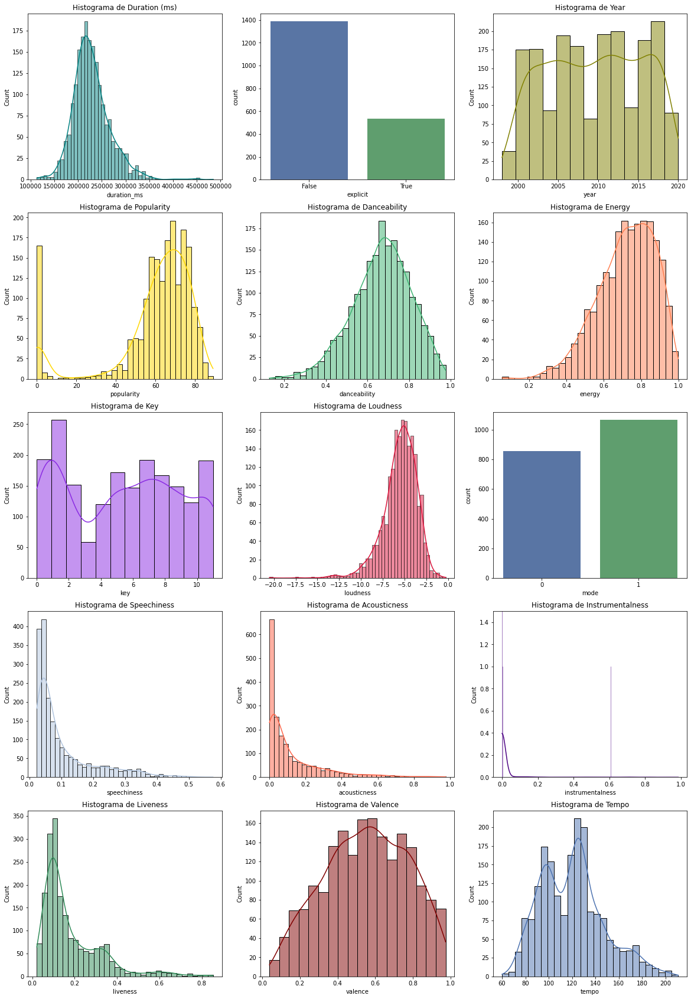

In [20]:
fig, axs = plt.subplots(5, 3, figsize=(20, 30))

sns.histplot(processed_df['duration_ms'], kde=True, ax=axs[0, 0], color="teal").set(title='Histograma de Duration (ms)')
sns.countplot(data=processed_df, x='explicit',   ax=axs[0, 1])
sns.histplot(processed_df['year'], kde=True, ax=axs[0, 2], color="olive").set(title='Histograma de Year')
sns.histplot(processed_df['popularity'], kde=True, ax=axs[1, 0], color="gold").set(title='Histograma de Popularity')
sns.histplot(processed_df['danceability'], kde=True, ax=axs[1, 1], color="mediumseagreen").set(title='Histograma de Danceability')
sns.histplot(processed_df['energy'], kde=True, ax=axs[1, 2], color="coral").set(title='Histograma de Energy')
sns.histplot(processed_df['key'], kde=True, ax=axs[2, 0], color="blueviolet").set(title='Histograma de Key')
sns.histplot(processed_df['loudness'], kde=True, ax=axs[2, 1], color="crimson").set(title='Histograma de Loudness')
sns.countplot(data=processed_df, x='mode',   ax=axs[2, 2])
sns.histplot(processed_df['speechiness'], kde=True, ax=axs[3, 0], color="lightsteelblue").set(title='Histograma de Speechiness')
sns.histplot(processed_df['acousticness'], kde=True, ax=axs[3, 1], color="tomato").set(title='Histograma de Acousticness')
sns.histplot(processed_df['instrumentalness'], kde=True, ax=axs[3, 2], color="indigo").set(title='Histograma de Instrumentalness', ylim=(0, 1.5))
sns.histplot(processed_df['liveness'], kde=True, ax=axs[4, 0], color="seagreen").set(title='Histograma de Liveness')
sns.histplot(processed_df['valence'], kde=True, ax=axs[4, 1], color="maroon").set(title='Histograma de Valence')
sns.histplot(processed_df['tempo'], kde=True, ax=axs[4, 2]).set(title='Histograma de Tempo')

plt.show()

De acuerdo con las gráficas anteriores y el reporte de `Pandas Profile`:
* `duration_ms`\\
La media de la distribución se encuentra alrededor de 228 s, además tenemos canciones entre 113 s y 484s. 
* `explicit` \\
Variable booleana donde el 27.8 % de canciones están marcadas como explicit en `True`.
* `Year` \\
Tenemos datos de 23 años, desde 1998 hasta el 2020, con sólo 3 canciones para el año 2020. Asimismo, tenemos mayor cantidad de canciones entre los años 2017 - 2019.
* `popularity` \\
De acuerdo con la gráfica, observamos que su distribución probablemente es bimodal, la primera moda cercana a 0 y la segunda a 70. Toma valores entre 0 y 89.
* `Danceability` \\
Esta propiedad tiene una media cercana a 0.67, indicando que más de la mitad de las canciones son bailables si consideramos el umbral en 0.5. Toma valores entre 0.12 y 0.97.
* `Energy` \\
la media se distribuye alrededor de 0.72, la distribución luce sesgada negativamente. Toma valores entre 0.055 y 0.999.
* `key` \\
Esta variable tiene valores entre 0 y 10 (discretos), tomando 12 valores distintos. La moda está entre 1 y 2.
* `loudness` \\
Esta distribución toma valores negativos entre -0.276 y -20.514. Su media es de -5.51.
* `mode` \\
Esta variable toma valores discretos de 0 y 1. Aproximadamente el 55 % toman el valor de 1.
* `speechiness` \\
La distribución toma valores positivos entre 0.0232 y 0.576, su media es de 0.10 y luce sesgada positivamente.
* `acousticness` \\
La distribución tiene la media en 0.12, luce sesgada positivamente y agrupa la mayor cantidad de sus valores cercanos a 0.
* `instrumentalness` \\
La distribución tiene una media de 0.015 y luce sesgada positiva, agrupando la mayor parte de sus datos muy cercanos a 0.
* `liveness` \\
Tenemos 781 valores distintos, la media está cercana a 0.18, y la distribución luce como si tuviera 2 modas (bimodal).
* `valence` \\
La distribución tiene una media de 0.55, toma valores en el intervalo (0,1).
* `tempo` \\
La distribución luce como si tuviera 3 modas (trimodal) y toma valores continuos entre 60 y 210.

In [21]:
print('Artist table visualization')
print(processed_df.groupby('artist')['song'].count().sort_values(ascending=False).head(15))
print('Song table visualization')
print(processed_df.groupby('song')['song'].count().sort_values(ascending=False).head(15))

Artist table visualization
artist
Drake              23
Rihanna            23
Eminem             21
Calvin Harris      19
Britney Spears     19
David Guetta       18
Kanye West         16
Chris Brown        16
Beyoncé            16
Katy Perry         16
Taylor Swift       15
Black Eyed Peas    14
P!nk               14
Ariana Grande      13
Maroon 5           13
Name: song, dtype: int64
Song table visualization
song
Sorry                   4
Closer                  3
Higher                  3
Faded                   3
I Like It               3
Mercy                   3
Spotlight               2
Baby                    2
When I'm Gone           2
Good Life               2
Stole the Show          2
Don't                   2
Motivation              2
Wherever You Will Go    2
Miss Independent        2
Name: song, dtype: int64


* `Artist` \
Los artistas con mayor cantidad de canciones en el dataset está encabezado por Drake y Rihanna con 23 canciones cada uno. En total tenemos 828 artistas.
* `Song` \
Hay 1861 canciones distintas, de las cuales algunas comparten el nombre tal como 4 canciones llamadas Sorry.


Dado que una canción puede pertenecer a varios géneros, se optará por aplicar un explode a la columna `genre` para realizar los análisis sobre cada fila particular. De esta manera cada fila corresponde a un género distinto. Este dataframe se usará cuando se necesite aplicar análisis por género.

In [22]:
def explode_by_genre(input_df):
    """
    Apply explode in genre column by comma, replace quotes if exist with empty character and reurn a new DataFrame.
    """
    new_df = input_df.copy()
    new_df['genre'] = new_df['genre'].str.split(',')
    new_df = new_df.explode('genre')
    new_df['genre'] = new_df['genre'].apply(lambda x: str(x).strip().replace('"', ''))
    return new_df
genre_df = explode_by_genre(processed_df)

[Text(0.5, 1.0, 'Distribución de géneros')]

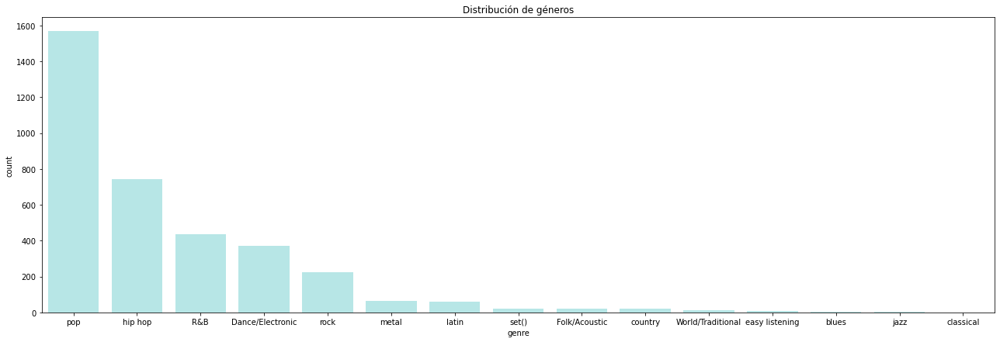

In [23]:
fig, ax = plt.subplots(figsize=(22, 7))
sns.countplot(data=genre_df, x='genre', order = genre_df.genre.value_counts().index, color='paleturquoise').set(title='Distribución de géneros')

* ``genre`` \
De acuerdo con la gráfica anterior, tenemos 15 géneros musicales distintos y observamos que la mayor cantidad de canciones está presente con el género *pop*, seguida de *hip hop* y *R&B*. Adicionalmente, el género set() no tiene una representación en el mundo real, por lo que se presume sea algún tipo de error en la toma de datos.


# Punto 1
¿Cuál es el top 10 de artistas más activos de los últimos 10 años?
### Top 10 artistas por cantidad de canciones en los últimos 10 años
Debido a que tenemos datos hasta 2020 se contará desde 2010 para obtener el top 10 de artistas.

In [24]:
max_year = processed_df['year'].max()
processed_df[(max_year - processed_df['year'])<=10].groupby(['artist'])['song'].count().sort_values(ascending=False).head(10)

artist
Drake            22
David Guetta     18
Calvin Harris    17
Taylor Swift     13
Katy Perry       13
Ariana Grande    13
Maroon 5         11
Jason Derulo     11
Bruno Mars       11
Rihanna          11
Name: song, dtype: int64

[Text(0.5, 1.0, 'Top 10 artistas más activos en los últimos 10 años')]

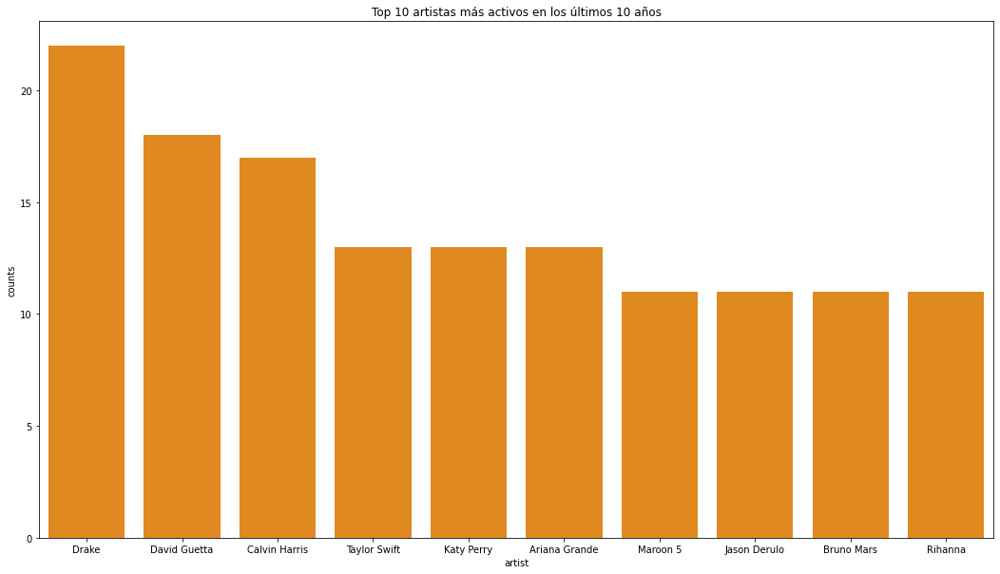

In [25]:
fig, ax = plt.subplots(figsize=(18, 10))
top_10_artists_df = processed_df[(max_year - processed_df['year'])<=10].groupby(['artist'])['song'].count().reset_index(name='counts').sort_values(by='counts', ascending=False).head(10)
sns.barplot(x='artist', y = 'counts', data = top_10_artists_df, color='darkorange').set(title='Top 10 artistas más activos en los últimos 10 años')

In [26]:
top_10_artists_df

,artist,counts
119,Drake,22
106,David Guetta,18
71,Calvin Harris,17
402,Taylor Swift,13
208,Katy Perry,13
29,Ariana Grande,13
280,Maroon 5,11
189,Jason Derulo,11
65,Bruno Mars,11
355,Rihanna,11


Si consideramos el top 10 de los artistas con mayor cantidad de canciones de los últimos 10 años del dataset, vemos que Drake encabeza la lista con 22 canciones, continúa David Guetta con 18 canciones y cierran la lista 4 artistas con 11 canciones cada uno.

### Top 10 artistas por popularidad media en los últimos 10 años
Se tomará en cuenta la popularidad media de cada artista y se obtendrá el top 10.

[Text(0.5, 1.0, 'Top 10 artistas con canciones mas populares en promedio en los últimos 10 años')]

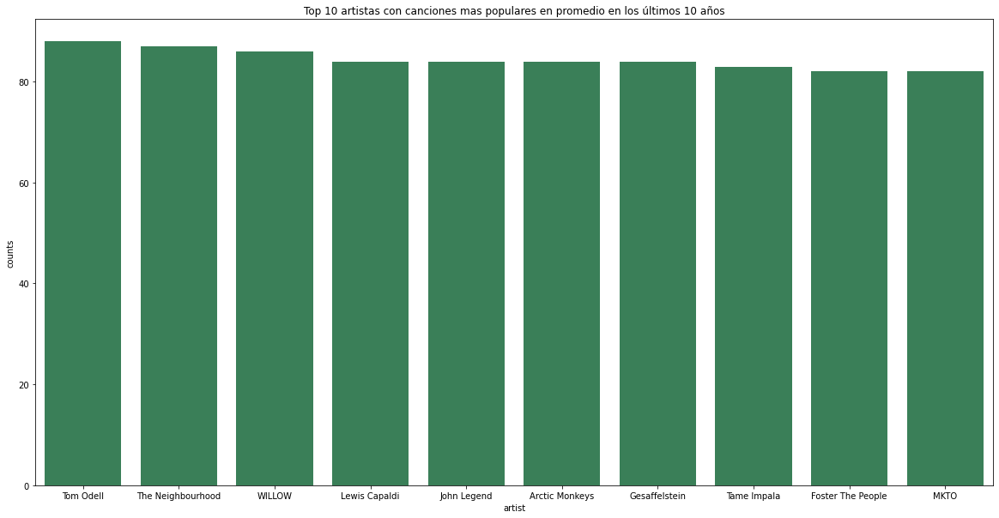

In [27]:
fig, ax = plt.subplots(figsize=(20, 10))
top_10_artists_popularity_df = processed_df[(max_year - processed_df['year'])<=10].groupby(['artist'])['popularity'].mean().reset_index(name='counts').sort_values(by='counts', ascending=False).head(10)
sns.barplot(x='artist', y = 'counts', data = top_10_artists_popularity_df, color='seagreen').set(title='Top 10 artistas con canciones mas populares en promedio en los últimos 10 años')

Si consideramos el top 10 de los artistas con mejor popularidad media en los últimos 10 años del dataset, vemos que Tom Odell y The Neighborhood encabezan la lista.

## Punto 2 
¿Cómo se diferencian las canciones de los géneros de Latin y Folk/Acoustic en relación con su duración? Halle la diferencia del tiempo promedio de ambos géneros.


In [28]:
latin_df = genre_df[genre_df['genre'] == 'latin']
folk_acoustic_df = genre_df[genre_df['genre'] == 'Folk/Acoustic']

In [29]:
difference_mean = latin_df['duration_ms'].mean()-folk_acoustic_df['duration_ms'].mean()
print('La diferencia del tiempo promedio entre Latin y Folk/acoustinc es de: ', round(difference_mean, 1), ' milisegundos.')

La diferencia del tiempo promedio entre Latin y Folk/acoustinc es de:  6400.1  milisegundos.


Text(0, 0.5, 'Frequency')

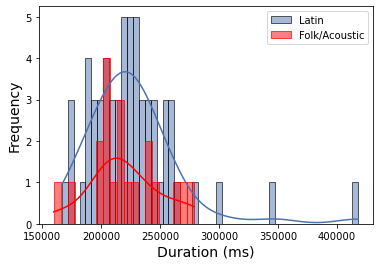

In [30]:
sns.histplot(latin_df['duration_ms'], bins=50, alpha=0.5, label='Latin', edgecolor='k', kde=True)
sns.histplot(folk_acoustic_df['duration_ms'], bins=20, alpha=0.5, label='Folk/Acoustic', edgecolor='r', color='r', kde=True)
plt.legend(loc='upper right')
plt.xlabel('Duration (ms)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

* La duración del género Latin es en  promedio mayor que la de Folk/Acoustic.

[Text(0, 0.5, 'Folk/Acoustic')]

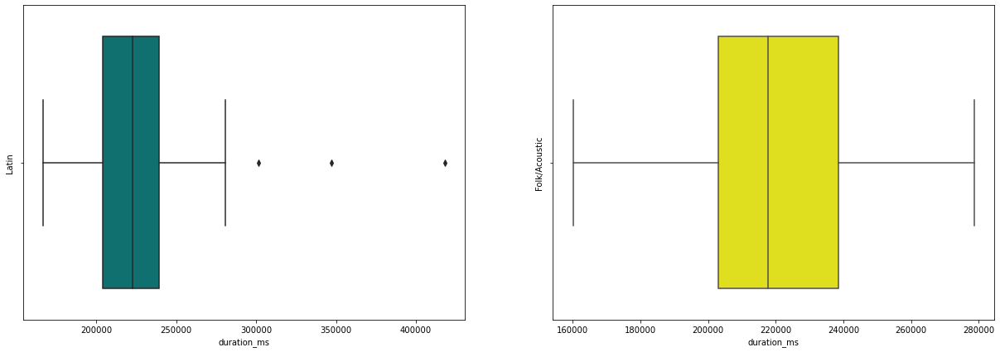

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(21, 7))
sns.boxplot(data = latin_df, x='duration_ms', color="teal", ax=axs[0]).set(ylabel='Latin')
sns.boxplot(data = folk_acoustic_df, x= 'duration_ms', color="yellow", ax=axs[1]).set(ylabel='Folk/Acoustic')

* El 50% de la duración de las canciones del género Latin está entre 204160 ms y 239026 ms,  IQR=34866ms.
* El 50% de la duración de las canciones del género Folk/Acoustic está entre 203166 ms y 238541 ms, IQR=35375ms.
* Al parecer tenemos valores atípicos de duración en el género Latin entre 300000 y 420000 ms.

## Punto3 - Top 5 géneros
Halle el top 5 de los géneros del 2019 según la cantidad de canciones. ¿Cómo ha variado la cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019?  \\
Para este punto se hallará el top 5 de canciones por género en cada año. Para ello se hará uso de la función explode mencionada en el punto 1, de tal manera que cada canción corresponda a un género, pudiendo tener más de una canción asociada a más de un género.

In [32]:
def get_top_five_genres_by_year(input_df, year):
    """
    Filter by year parameter and group by genre and year.
    """
    new_df = explode_by_genre(input_df)
    new_df = new_df[new_df['year'] == year]
    return new_df.groupby(['genre', 'year'])['genre'].count().sort_values(ascending=False)[0:5].reset_index(name='counts')

### Top 5 géneros del 2019

In [33]:
top5_2019 = get_top_five_genres_by_year(processed_df, 2019)
top5_2019

,genre,year,counts
0,pop,2019,62
1,hip hop,2019,36
2,Dance/Electronic,2019,20
3,R&B,2019,9
4,latin,2019,8


### Top 5 géneros del 2015

In [34]:
top5_2015 = get_top_five_genres_by_year(processed_df, 2015)
top5_2015

,genre,year,counts
0,pop,2015,80
1,hip hop,2015,29
2,Dance/Electronic,2015,26
3,R&B,2015,19
4,rock,2015,13


### Top 5 géneros del 2010

In [35]:
top5_2010 = get_top_five_genres_by_year(processed_df, 2010)
top5_2010

,genre,year,counts
0,pop,2010,94
1,hip hop,2010,52
2,Dance/Electronic,2010,28
3,R&B,2010,22
4,rock,2010,6


### Top 5 géneros del 2005

In [36]:
top5_2005 = get_top_five_genres_by_year(processed_df, 2005)
top5_2005

,genre,year,counts
0,pop,2005,78
1,hip hop,2005,50
2,R&B,2005,30
3,rock,2005,18
4,Dance/Electronic,2005,5


### Top 5 géneros del 2000

In [37]:
top5_2000 = get_top_five_genres_by_year(processed_df, 2000)
top5_2000

,genre,year,counts
0,pop,2000,53
1,R&B,2000,24
2,hip hop,2000,19
3,rock,2000,12
4,metal,2000,7


([<matplotlib.axis.YTick at 0x7fa89a1eb970>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

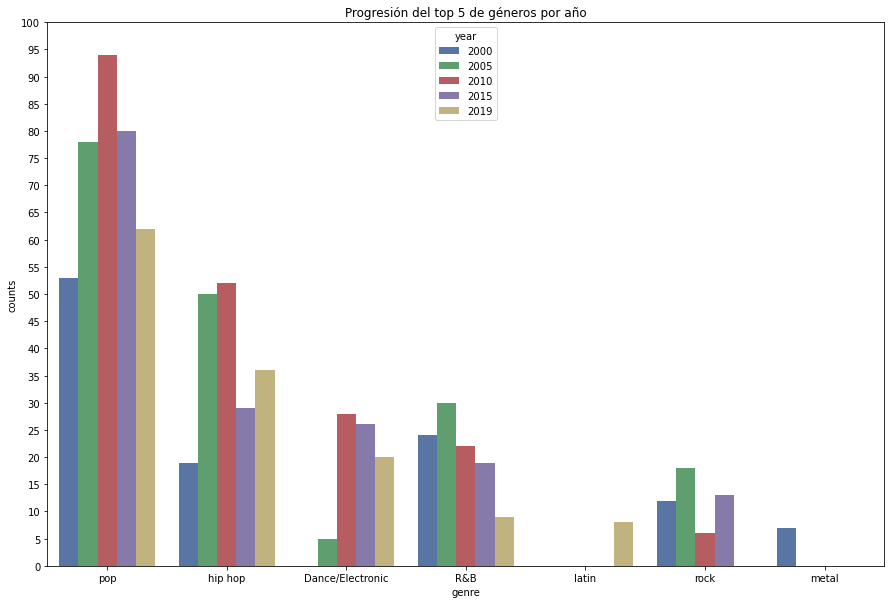

In [38]:
fig, ax = plt.subplots(figsize=(15, 10))
cdf = pd.concat([top5_2019, top5_2015, top5_2010, top5_2005, top5_2000])
hist_top_genres = sns.barplot(x='genre', y='counts', data=cdf, hue='year').set(title='Progresión del top 5 de géneros por año')
plt.yticks(np.linspace(0,100, num=21))

* El género `pop` tuve su mayor pico en el año 2010 con cerca de 95 canciones y fue menos popular en el año 2000 con menos de 60 canciones. En los años observados estuvo siempre en el top 5. Asimismo es el género con mayor cantidad de canciones en todos los años observados.
* El género `hip hop` concentró la mayor cantidad de canciones en los años 2005 y 2010 y fue menos popular en el año 2000. En los años observados estuvo siempre en el top 5.
* El género `Dance-Electronic` tuvo la mayor cantidad de canciones en los años 2010 y 2015. No estuvo en el top 5 el año 2000 y para el año 2005 tuvo menos de 10 canciones registradas.
* El género `R&B` tuvo su pico en el año 2005 y se observa una tendencia bajista en cuanto a cantidad de canciones, teniendo su mínimo (dentro de los años observados en la gráfica) en el año 2019. En los años observados estuvo siempre en el top 5.
* El género `latin` solo estuvo en el top 5 hasta el año 2019.
* El género `rock` no estuvo en el top 5 en el año 2019 y tuvo su pico en el año 2005.
* El género `metal` estuvo en el top 5 en el año 2000.

## Punto 4 - Progresión nuevos artistas
¿Cómo ha sido la progresión de nuevos artistas? Asuma que un artista nuevo es aquel del
cual no se tiene registros pasados y solo es nuevo durante el primer año de aparición.

In [39]:
new_artists_progression_df = processed_df.groupby(['artist'])['year'].min().reset_index()
new_artists_progression_df = new_artists_progression_df.groupby('year').agg({'artist': 'size'}).reset_index()
new_artists_progression_df['artist'].sum()

828

[Text(0.5, 1.0, 'Progresión artistas nuevos por año')]

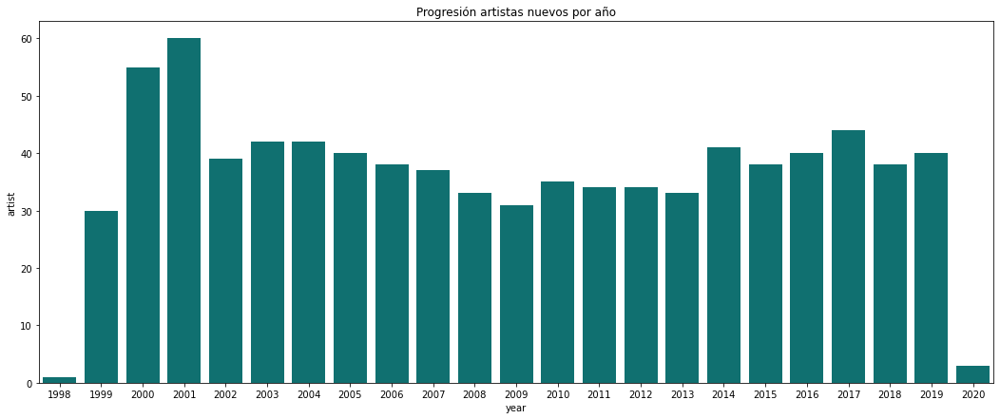

In [40]:
fig, ax = plt.subplots(figsize=(18, 7))
sns.barplot(data=new_artists_progression_df, x='year', y='artist', color='teal').set(title='Progresión artistas nuevos por año')

De acuerdo a la gráfica anterior se observa que durante los años 1998-2000 hubo un gran crecimiento en la cantidad de nuevos artistas. Durante los años 2003-2009 hubo una tendencia bajista en la aparición de nuevos artistas. Durante los años 2010-2013 se mantuvo relativamente constante. Durante los años 2015-2017 hubo un leve crecimiento en la aparición de nuevos artistas.

## Punto 5 - Progresión de la popularidad promedio por género y por año

In [41]:
genre_df[genre_df['year'] == 2020]

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
308,t.A.T.u.,All The Things She Said,214440.0,True,2020,39.0,0.527,0.834,5,-5.767,0,0.0474,0.0411,0.005990,0.105,0.381,179.920,pop
568,Will Smith,Switch,197666.0,False,2020,34.0,0.873,0.900,5,-4.325,0,0.1800,0.0107,0.000502,0.556,0.478,102.516,hip hop
568,Will Smith,Switch,197666.0,False,2020,34.0,0.873,0.900,5,-4.325,0,0.1800,0.0107,0.000502,0.556,0.478,102.516,pop
1991,NSG,Options,240081.0,True,2020,57.0,0.836,0.621,1,-4.684,0,0.0894,0.3890,0.000092,0.104,0.762,101.993,World/Traditional
1991,NSG,Options,240081.0,True,2020,57.0,0.836,0.621,1,-4.684,0,0.0894,0.3890,0.000092,0.104,0.762,101.993,hip hop


In [42]:
genre_df[genre_df['genre'] == 'set()'].shape

(22, 18)

Dado que tenemos alrededor de 22 años en el conjunto de datos, se decide agrupar cada 4 años para revisar la progresión de la popularidad promedio de manera más sencilla en la gráfica. Asimismo, se decide agrupar los años 1998 y 1999 en un sólo grupo para tener una referencia del cambio de milenio. Adicionalmente, dado que del año 2020 tenemos sólo 3 canciones de 3 géneros, no se tendrá en cuenta en el análisis, dado que no es una muestra representativa. Adicionalmente, el género set(), el cual no tiene una representación en el mundo real, tiene 22 canciones, dado que son pocas se excluirá del presente análisis.

In [43]:
# Add quarter column with the year group
popularity_df = genre_df[['genre', 'year', 'popularity']].groupby(['year', 'genre']).mean().reset_index()
popularity_df = popularity_df[popularity_df['year'] !=2020]
popularity_df = popularity_df[popularity_df['genre'] !='set()']
popularity_df['quarter'] = np.where(popularity_df['year'] < 2000, '1998-1999', '')
popularity_df['quarter'] = np.where((popularity_df['year'] >= 2000) & (popularity_df['year'] <= 2003), '2000-2003', popularity_df['quarter'])
popularity_df['quarter'] = np.where((popularity_df['year'] >= 2004) & (popularity_df['year'] <= 2007), '2004-2007', popularity_df['quarter'])
popularity_df['quarter'] = np.where((popularity_df['year'] >= 2008) & (popularity_df['year'] <= 2011), '2008-2011', popularity_df['quarter'])
popularity_df['quarter'] = np.where((popularity_df['year'] >= 2012) & (popularity_df['year'] <= 2015), '2012-2015', popularity_df['quarter'])
popularity_df['quarter'] = np.where((popularity_df['year'] >= 2016) & (popularity_df['year'] <= 2019), '2016-2019', popularity_df['quarter'])
popularity_df

,year,genre,popularity,quarter
0,1998,R&B,49.000000,1998-1999
1,1998,hip hop,49.000000,1998-1999
2,1998,pop,49.000000,1998-1999
3,1999,Dance/Electronic,57.000000,1998-1999
4,1999,Folk/Acoustic,65.000000,1998-1999
...,...,...,...,...
190,2019,hip hop,64.916667,2016-2019
191,2019,latin,74.750000,2016-2019
192,2019,metal,32.500000,2016-2019
193,2019,pop,60.951613,2016-2019


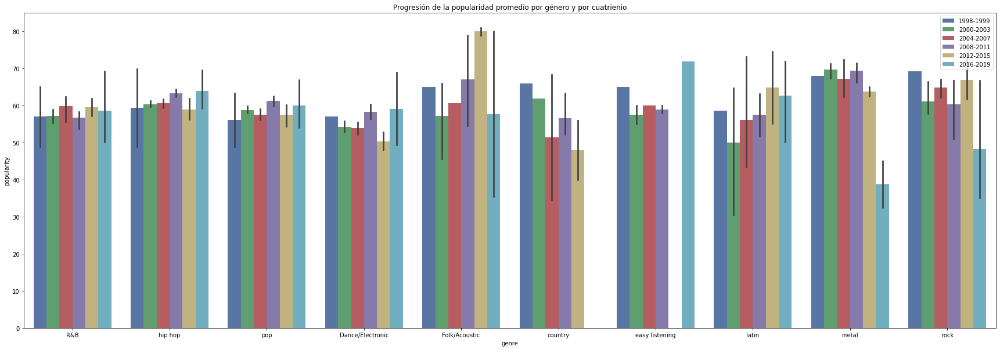

In [44]:
fig, ax = plt.subplots(figsize=(30, 10))
sns.barplot(x='genre', y='popularity', data=popularity_df[~popularity_df['genre'].isin(['blues','World/Traditional', 'jazz', 'classical'])], hue='quarter')\
.set(title='Progresión de la popularidad promedio por género y por cuatrienio')
plt.legend(loc='upper right')

* El género `R&B` a lo largo de los años ha mantenido su popularidad promedio similar, entre 50 y 70.
* El género `hip-hop` parece no tener una tendencia marcada en su popularidad promedio hasta los años 2016-2019, esta se mantuvo entre 50 y 70.
* El género `pop` tuvo una popularidad similar desde los años 1998-2019.
* El género `Dance/Electronic` ha ganado popularidad en los últimos años. Tuvo un mínimo de popularidad promedio para los años 2012-2015.
* El género `Folk/Acoustic` tuvo un pico de popularidad media en los años 2012-2015 y luego cayó para los años 2016-2019. 
* El género `country` parece obedecer una tendencia a la baja. Para años recientes no contamos con canciones de este género.
* En el género `easy-listening` no se observan tendencias. Se observa ausencia de canciones para los años 2012-2015.
* El género `latin` parece representar una tendencia alcista en su popularidad desde los años 2000-2003.
* El género `metal` presenta una tendencia a la baja en su popularidad desde los años 2012-2015.
* El género `rock` al parecer presenta una tendencia a la baja en su popularidad promedio desde los años 2012-2015. En los años anteriores se ha mantenido sin mayores cambios. 
\
Dado que para algunos géneros tenemos pocos datos, la siguiente gráfica se realiza por año.

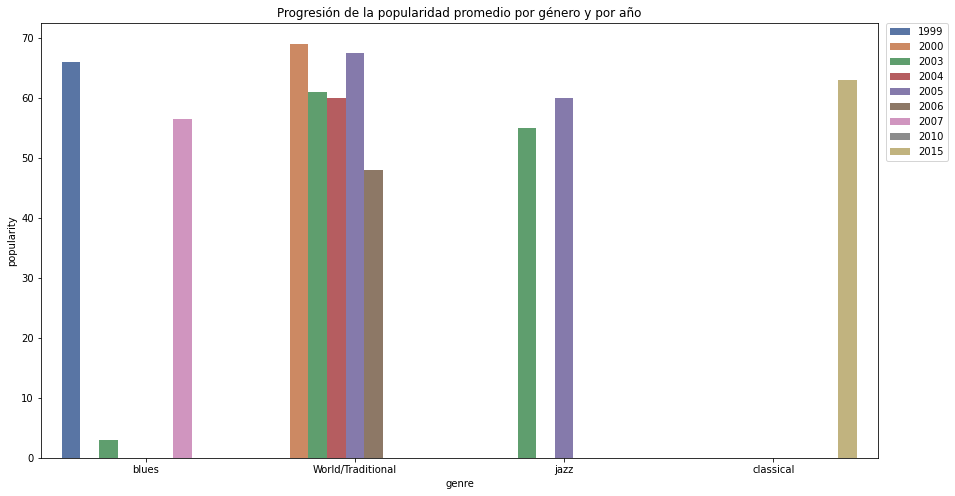

In [45]:
fig, ax = plt.subplots(figsize=(15, 8))
genres_years_df = popularity_df[popularity_df['genre'].isin(['blues','World/Traditional', 'jazz', 'classical'])]
sns.barplot(x='genre', y='popularity', data=genres_years_df, hue='year', palette='deep').set(title='Progresión de la popularidad promedio por género y por año')
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)

In [46]:
popularity_df[popularity_df['genre'] == 'classical']

,year,genre,popularity,quarter
159,2015,classical,63.0,2012-2015


* El género `blues` Fue muy popular en los años 1998-1999, tuvo un mínimo de popularidad en los años 2000-2003 y luego comenzó a ganar más popularidad. Sin embargo, no contamos con este género para años posteriores al 2007.
* El género `World/Traditional` presenta una tendencia a la baja en su popularidad media.
* Del género `jazz` contamos con pocos años para identificar tendencias.
* Del género `classical` sólo tenemos datos para el año 2015. Luce como un género nuevo, del que sólo tenemos una canción.

## Punto 6

In [47]:
pop_df = genre_df[genre_df['genre'] == 'pop']
rock_df = genre_df[genre_df['genre'] == 'rock']

pop_energy_df = pop_df[['energy']]
rock_energy_df = rock_df[['energy']]

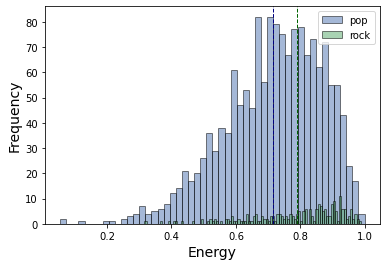

In [48]:
plt.hist(pop_energy_df['energy'], bins=50, alpha=0.5, label='pop', edgecolor='k')
plt.hist( rock_energy_df['energy'], bins=100, alpha=0.5, label='rock', edgecolor='k')
plt.axvline(pop_energy_df['energy'].mean(), color='navy', linestyle='dashed', linewidth=1)
plt.axvline(rock_energy_df['energy'].mean(), color='darkgreen', linestyle='dashed', linewidth=1)
plt.legend(loc='upper right')
plt.xlabel('Energy', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

* La media de `energy` en el rock es superior que el pop.
* Ambas distribuciones tienen sesgo negativo.

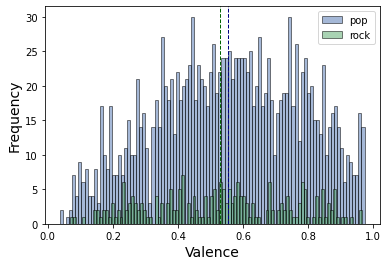

In [49]:
plt.hist(pop_df['valence'], bins=100, alpha=0.5, label='pop', edgecolor='k')
plt.hist(rock_df['valence'], bins=100, alpha=0.5, label='rock', edgecolor='k')
plt.axvline(pop_df['valence'].mean(), color='navy', linestyle='dashed', linewidth=1)
plt.axvline(rock_df['valence'].mean(), color='darkgreen', linestyle='dashed', linewidth=1)
plt.legend(loc='upper right')
plt.xlabel('Valence', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

* La media de `valence` en pop es ligeramente más alta que rock

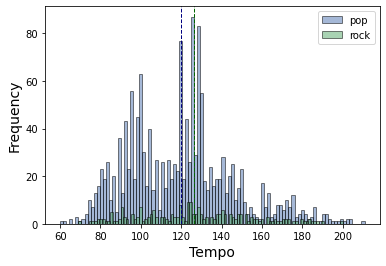

In [50]:
plt.hist(pop_df['tempo'], bins=100, alpha=0.5, label='pop', edgecolor='k')
plt.hist(rock_df['tempo'], bins=100, alpha=0.5, label='rock', edgecolor='k')
plt.axvline(pop_df['tempo'].mean(), color='navy', linestyle='dashed', linewidth=1)
plt.axvline(rock_df['tempo'].mean(), color='darkgreen', linestyle='dashed', linewidth=1)
plt.legend(loc='upper right')
plt.xlabel('Tempo', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

* La media de `Tempo` en rock es más alta que la de pop

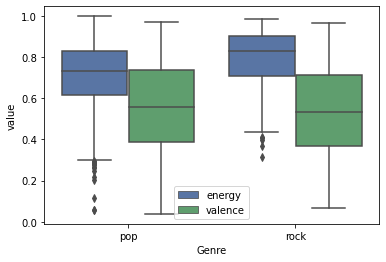

In [51]:
pop_energy_valence_df = pop_df[['energy', 'valence']]
rock_enery_valence_df = rock_df[['energy', 'valence']]
cdf = pd.concat([pop_energy_valence_df.assign(Genre='pop'), rock_enery_valence_df.assign(Genre='rock')])
mdf = pd.melt(cdf, id_vars=['Genre'], var_name=['Variable'])
ax = sns.boxplot(x="Genre", y="value", hue="Variable", data=mdf)
ax.legend(loc='lower center')
plt.show()
plt.clf()
plt.close()

* La mediana de `energy` de pop está por debajo que la del rock.
* La distribución de `valence` en ambos géneros luce simétrica y la mediana en el rock es ligeramente menor a la del pop.
* El límite inferior de la distribución de `energy` del pop  es menor que la del rock.

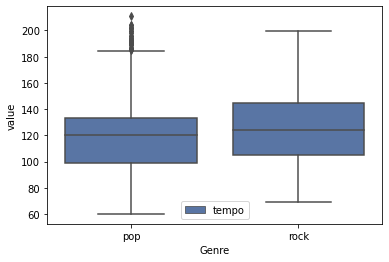

In [52]:
pop_tempo_df = pop_df[['tempo']]
rock_tempo_df = rock_df[['tempo']]
cdf = pd.concat([pop_tempo_df.assign(Genre='pop'), rock_tempo_df.assign(Genre='rock')])
mdf = pd.melt(cdf, id_vars=['Genre'], var_name=['Variable'])
ax = sns.boxplot(x="Genre", y="value", hue="Variable", data=mdf)
ax.legend(loc='lower center')
plt.show()
plt.clf()
plt.close()

* Las medianas de `tempo` para ambos géneros son muy similares.
* En el pop se observan valores atípicos por encima de 190.

# Punto 7
Plantee una pregunta de negocio de su interés, ya sea por tipo de música, artistas u otra
dimensión, mediante la cual se analicen al menos 3 variables del dataset y concluya.

### ¿Existe relación entre la popularidad de una canción de pop y las variables `instrumentalness`, `danceability`, `energy`, `loudness` y `valence`?

In [53]:
pop_df.shape

(1567, 18)

Analizaremos el comportamiento entre las variables `instrumentalness`, `danceability`, `energy`, `loudness` y `valence` y la popularidad de una canción para las canciones de pop.

<AxesSubplot:xlabel='popularity', ylabel='instrumentalness'>

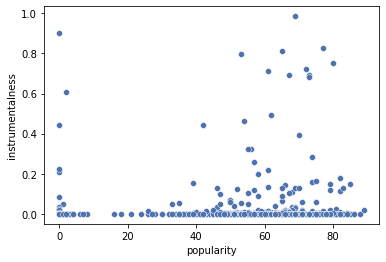

In [54]:
sns.scatterplot(data = pop_df, y='instrumentalness', x= 'popularity')

<AxesSubplot:xlabel='popularity', ylabel='danceability'>

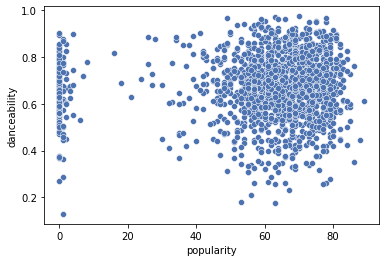

In [55]:
sns.scatterplot(data = pop_df, y='danceability', x= 'popularity')

<AxesSubplot:xlabel='popularity', ylabel='energy'>

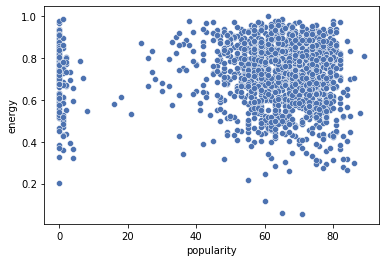

In [56]:
sns.scatterplot(data = pop_df, y='energy', x= 'popularity')

<AxesSubplot:xlabel='popularity', ylabel='loudness'>

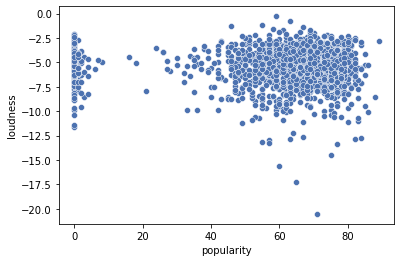

In [57]:
sns.scatterplot(data = pop_df, y='loudness', x= 'popularity')

<AxesSubplot:xlabel='popularity', ylabel='valence'>

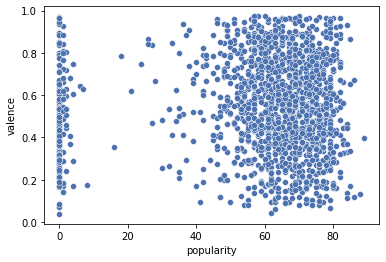

In [58]:
sns.scatterplot(data = pop_df, y='valence', x= 'popularity')

De acuerdo con las anteriores gráficas no se observa una correlación lineal fuerte entre las variables, se calculará la correlación:

In [59]:
pop_df[['popularity', 'instrumentalness', 'danceability', 'energy','loudness', 'valence']].corr()

,popularity,instrumentalness,danceability,energy,loudness,valence
popularity,1.000000,-0.021773,0.025537,-0.037246,-0.001908,-0.004962
instrumentalness,-0.021773,1.000000,0.034165,0.053999,-0.096626,0.024371
danceability,0.025537,0.034165,1.000000,-0.047088,-0.005844,0.421938
energy,-0.037246,0.053999,-0.047088,1.000000,0.662238,0.355434
loudness,-0.001908,-0.096626,-0.005844,0.662238,1.000000,0.252591
valence,-0.004962,0.024371,0.421938,0.355434,0.252591,1.000000


<AxesSubplot:>

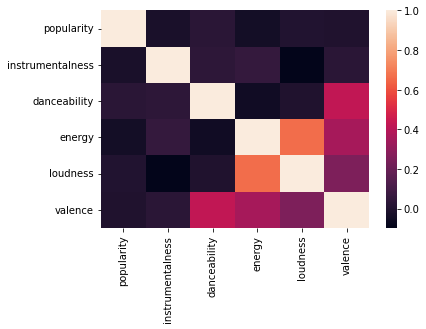

In [61]:
sns.heatmap(pop_df[['popularity', 'instrumentalness', 'danceability', 'energy','loudness', 'valence']].corr())

En las gráficas anteriores y sobre todo en el mapa de calor observamos que las correlaciones no son tan altas entre las variables `instrumentalness`, `danceability`, `energy`, `loudness`, `valence` y la popularidad. La variable que más impacto tiene en la popularidad es energy, el cual tiene una correlación de -0.037246. Asimismo, observamos que tenemos correlaciones más altas entre algunas varibales, tales como `energy` y `loudness` con una correlación de 0.66 y `energy` y `valence` con 0.35. A continuación se mostrará su gráfica.

<AxesSubplot:xlabel='energy', ylabel='loudness'>

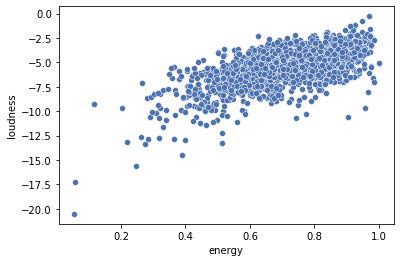

In [62]:
sns.scatterplot(data = pop_df, y='loudness', x= 'energy')

<AxesSubplot:xlabel='danceability', ylabel='valence'>

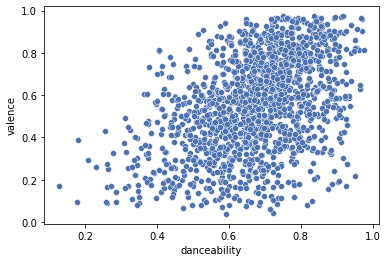

In [63]:
sns.scatterplot(data = pop_df, y='valence', x= 'danceability')

A continuación, se calculará la correlación de Spearman para ver si existe una correlación monótona entre las variables anteriormente mencionadas y la popularidad.

In [64]:
pop_df[['popularity', 'instrumentalness', 'danceability', 'energy','loudness', 'valence']].corr(method='spearman')

,popularity,instrumentalness,danceability,energy,loudness,valence
popularity,1.000000,-0.065753,0.015351,-0.084695,0.002312,-0.057505
instrumentalness,-0.065753,1.000000,0.065487,0.121222,-0.091575,0.023755
danceability,0.015351,0.065487,1.000000,-0.108731,-0.017891,0.414282
energy,-0.084695,0.121222,-0.108731,1.000000,0.612665,0.325441
loudness,0.002312,-0.091575,-0.017891,0.612665,1.000000,0.233961
valence,-0.057505,0.023755,0.414282,0.325441,0.233961,1.000000


De acuerdo con la tabla anterior, observamos que la variable `energy` y la popularidad tienen una correlación de spearman de -0.084695, mostrando una relación monótona decreciente bastante débil. En cuanto a las demás variables estás igualmente presentan una relación bastante débil con la popularidad.

En conclusión la relación entre las variables `instrumentalness`, `danceability`, `energy`, `loudness`, `valence` no influyen individualmente en la popularidad de una canción de pop. Asimismo de las cinco variables, la que más influye sólo con un factor de -0.037 (Pearson) es `energy`.